Variable definitions:

(Primary constants) (will be loaded)
1. `A::Matrix{Int64}` a 500x52 matrix. `A[i,j]` shows how many material `i` are available on week `j`.
2. `D::Matrix{Int64}` a 20x52 matrix. `D[i,j]` shows the demands of product `i` on week `j`.
3. `H::Vector{Float64}` a 52x1 vector. `H[i]` shows how much the holding cost of product `i`.
4. `P::Vector{Float64}` a 52x1 vector. `P[i]` shows how much product `i` can be sold.
5. `R::Matrix{Int64}` a 500x20 matrix. `R[i,j]` shows requirements of material `i` to produce product `j`.

(Secondary variables)

6. `N::Matrix{Float64}` a 20 x 52 matrix. `P[i,j]` shows how much net profit you gain from product `i` on week `j`.
7. `X::Matrix{Int64}` a 20 x 52 matrix. `X[i,j]` shows how many product `i` is manufactured on week `j`.
8. `I::Matrix{Int64}` a 20x52 matrix. `I[i,j]` shows how many product `i` are in the inventory at the start of week `j`.



Load primary constants

In [3]:
using IJulia
using CSV, DataFrames
#visualization packages
using Makie, CairoMakie
Makie.inline!(true)

true

In [4]:
#Dataframe should be ok for now.
A = CSV.read("HW1_data//availability.csv", DataFrame);
D = CSV.read("HW1_data//demand.csv", DataFrame);
H = CSV.read("HW1_data//holding.csv", DataFrame);
P = CSV.read("HW1_data//profit.csv", DataFrame);
R = CSV.read("HW1_data//requirements.csv", DataFrame);

Look at the first 3 rows of each one.

In [5]:
all_const = [A, D, H, P, R];
name_set = ["A", "D", "H", "P", "R"]
for i in eachindex(all_const)
    println(name_set[i],": " ,size(all_const[i]))
end

A: (500, 53)
D: (20, 53)
H: (52, 2)
P: (20, 2)
R: (500, 21)


In [6]:
names(A)

53-element Vector{String}:
 "material"
 "Week 1"
 "Week 2"
 "Week 3"
 "Week 4"
 "Week 5"
 "Week 6"
 "Week 7"
 "Week 8"
 "Week 9"
 "Week 10"
 "Week 11"
 "Week 12"
 ⋮
 "Week 41"
 "Week 42"
 "Week 43"
 "Week 44"
 "Week 45"
 "Week 46"
 "Week 47"
 "Week 48"
 "Week 49"
 "Week 50"
 "Week 51"
 "Week 52"

Visualizing the given matrices.

In [7]:
f1 = Figure(size =(1500,500)) 
# ax1 = Axis(f1[1, 1], limits = (nothing, nothing), title = "(nothing, nothing)")

ax1 = Axis(f1[1,1], title = "Availability",titlesize = 40, xticks = 1:52, 
limits = (0, 52 ,0, 300000),
# xtickformat = x -> names(A)[Int64(x.+1)]
)

for i in 1:500
    lines!(ax1, 1:52, collect(A[i, 2:end]) )
end

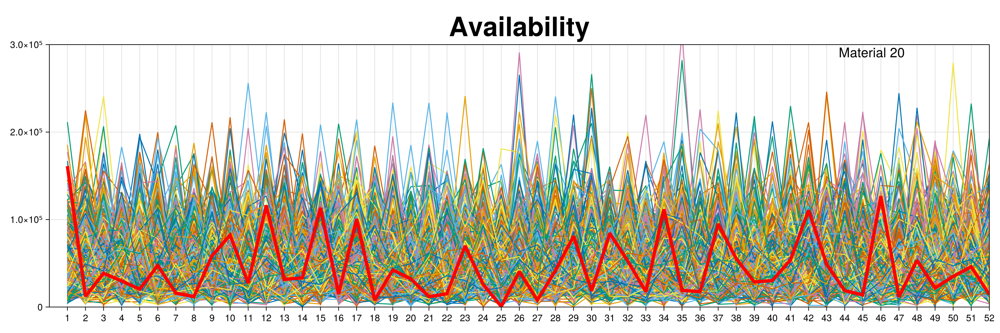

CairoMakie.Screen{IMAGE}


In [8]:
i = 20
lines!(ax1, 1:52, collect(A[i, 2:end]), linewidth = 5, color = :red)
text!(ax1, 0.91,1,text = "Material $i",space = :relative, fontsize = 20, align = (:right, :top))
display(f1)

Look at demands

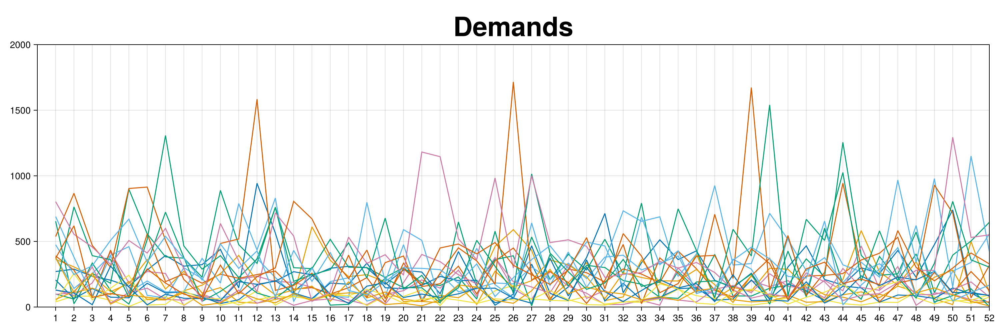

In [9]:
f2 = Figure(size =(1500,500))
# ax1 = Axis(f1[1, 1], limits = (nothing, nothing), title = "(nothing, nothing)")

ax2 = Axis(f2[1,1], title = "Demands",titlesize = 40, xticks = 1:52, 
limits = (0, 52 ,0, 2000),
# xtickformat = x -> names(A)[Int64(x.+1)]
);

for i in 1:20
    lines!(ax2, 1:52, collect(D[i, 2:end]));
end
display(f2);

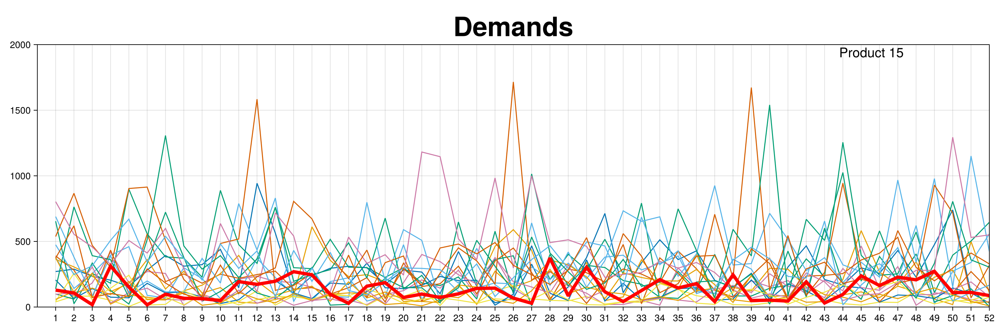

In [10]:
i = 15
lines!(ax2, 1:52, collect(D[i, 2:end]), linewidth = 5, color = :red)
text!(ax2, 0.91,1,text = "Product $i",space = :relative, fontsize = 20, align = (:right, :top))
display(f2);

Defining functions to calculate net profit on each week.

In [11]:
function findNetProfit(X::Matrix;
    A=A, D=D, H=H, P=P, R=R)
    N = zeros(Float64, 20, 52)
    I = zeros(Int64, 20, 52)
    for j in 1:20 #week
        holdingCostPerUnit = H[j, :holding]
        for i in 1:20
            demand = D[i, j+1]
            price = P[i, :profit]
            inventory = I[i, j]
            newlyProduced = X[i, j]
            totalProduct = newlyProduced + inventory
            
            if totalProduct ≥ demand
                income = demand * price
                holdingCost = (totalProduct - demand) * holdingCostPerUnit
                N[i, j] = income - holdingCost

                #update the inventory
                if j != 52 #not the last week
                    I[i, j+1] = totalProduct - demand
                end
            elseif  totalProduct == 0
                income = 0
                holdingCost = 0
            else #total product > demands
                income = totalProduct * price
                holdingCost = 0
                N[i, j] = income - holdingCost

                #update the inventory
                if j != 52 #not the last week
                
                    I[i, j+1] = clamp(totalProduct - demand,0, Inf)
                end
            end
        end
    end
    return sum(sum(N)), I
end

findNetProfit (generic function with 1 method)

In [12]:
function constraintsCheck(X; R = R,A = A )
    #check that production on each week is possible. 
    for j = 1:52
        # @show "reset"
        thisWeekAvailable = A[:,j+1]
        for i = 1:20 
            # @show thisWeekAvailable[253]
            thisWeekAvailable = thisWeekAvailable - X[i,j]*R[!,i+1]
            for k = 1:500
                if thisWeekAvailable[k] < 0 
                    # @show thisWeekAvailable[k]
                    # println("week: ",j)
                    # println("product: ",i)
                    # println("Material: ", k)
                    return false
                end
            end
        end
    end
    return true
end

constraintsCheck (generic function with 1 method)

In [13]:
#create a bunch of random X and plot sum(X) vs netProfit.
numberOfSamples = 100

hisSumX = zeros(numberOfSamples)
hisNetProfit = zeros(numberOfSamples)

for i in 1:numberOfSamples
    #create random X 
    X = rand(0:1,(20, 52))
    #check constraints 
    check = constraintsCheck(X)
    if check
        #find the profit.
        netProfit, I = findNetProfit(X)
    else
        netProfit = 0
    end
    #save
    hisSumX[i] = sum(X)
    hisNetProfit[i] = netProfit
end



In [14]:
Vector(hisNetProfit)


100-element Vector{Float64}:
 14983.719999999998
 13476.039999999997
 14093.259999999997
 14392.259999999997
 13185.79
 13504.889999999998
 14728.209999999994
 13822.829999999998
 14036.939999999999
 15039.369999999999
 14571.699999999993
 13009.36
 15102.46
     ⋮
 13829.909999999996
 13599.939999999999
 13058.929999999997
 14662.469999999998
 14339.239999999998
 14076.619999999995
 13812.919999999998
 15012.489999999996
 13664.009999999998
 14393.2
 14397.17
 13749.259999999998

Plot the result

In [15]:
# using StatsPlots
using Makie, GLMakie
Makie.inline!(true)

true

In [16]:
fRandom = Figure()
axRandom = Axis(fRandom[1, 1], title="Result plot", xlabel="number of productions [units]", ylabel="Profit [dollar]")
scatter!(axRandom, hisSumX, hisNetProfit)


Scatter{Tuple{Vector{Point{2, Float64}}}}

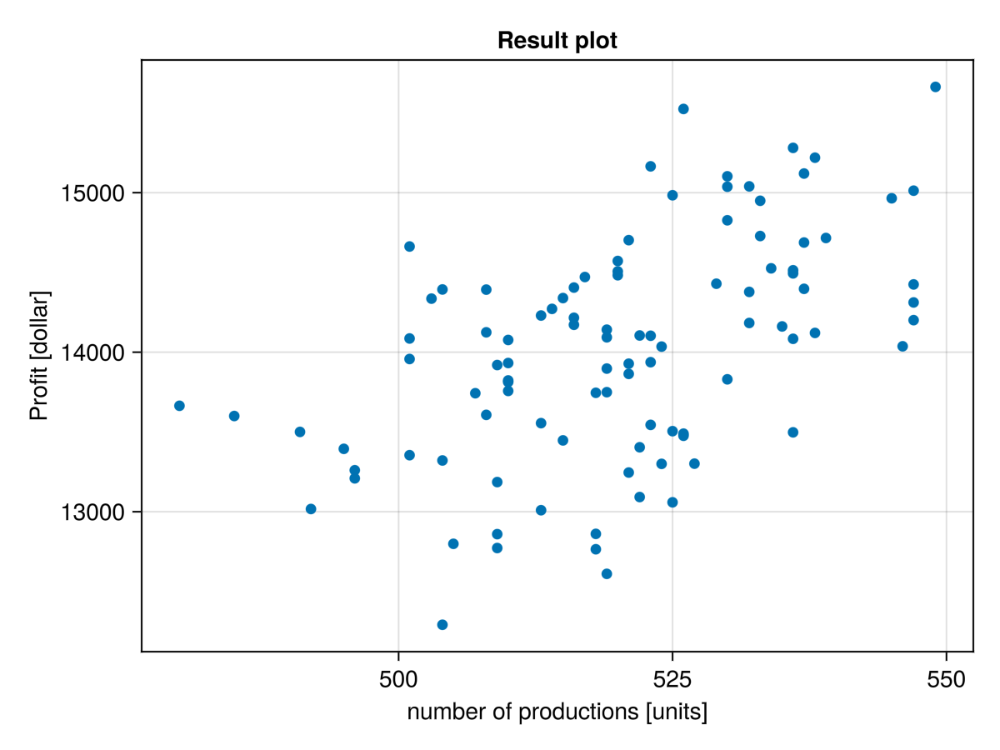

GLMakie.Screen(...)

In [17]:
display(fRandom)

Using JuMP


In [18]:
using JuMP, Gurobi

In [19]:
Amat = Matrix(A)[:,2:end];
Pvec = Matrix(P)[:,2];
Rmat = Matrix(R)[:,2:end];
Hvec = Matrix(H)[:,2:end];
Dmat = Matrix(D)[:,2:end];
Amat = Matrix(A)[:,2:end];
# X = ones(20,52)

In [20]:
@show size(Hvec)
@show size(Amat)
@show size(Rmat)

size(Hvec) = (52, 1)
size(Amat) = (500, 52)
size(Rmat) = (500, 20)


(500, 20)

In [210]:
model = Model(Gurobi.Optimizer); # Builds Gurobi model

@variable(model, X[1:20, 1:52] ≥ 0, Int); # Adds decision variables -> production matrix.
@variable(model, I[1:20, 1:52] ≥ 0, Int); # Add Inventory matrix
@variable(model, S[1:20, 1:52] ≥ 0),Int; # Add Selling matrix

@objective(model, Max, sum(Pvec'*S) .- sum(I*Hvec)) # Setting objective


Set parameter Username
Academic license - for non-commercial use only - expires 2025-09-06


29.98 S[1,1] + 95.66 S[2,1] + 67.95 S[3,1] + 54.89 S[4,1] + 56.75 S[5,1] + 115.59 S[6,1] + 63.52 S[7,1] + 48.52 S[8,1] + 101.33 S[9,1] + 91.22 S[10,1] + 55.34 S[11,1] + 71.26 S[12,1] + 39.91 S[13,1] + 32.68 S[14,1] + 54.7 S[15,1] + 88.79 S[16,1] + 137.06 S[17,1] + 110.37 S[18,1] + 48.46 S[19,1] + 37.82 S[20,1] + 29.98 S[1,2] + 95.66 S[2,2] + 67.95 S[3,2] + 54.89 S[4,2] + 56.75 S[5,2] + 115.59 S[6,2] + 63.52 S[7,2] + 48.52 S[8,2] + 101.33 S[9,2] + 91.22 S[10,2] + [[...2020 terms omitted...]] - 3.07 I[20,23] - 1.6 I[20,24] - 6.83 I[20,25] - 8.84 I[20,26] - 4 I[20,27] - 6.87 I[20,28] - 5.11 I[20,29] - 8.65 I[20,30] - 9.34 I[20,31] - 46.47 I[20,32] - 4.23 I[20,33] - 9.92 I[20,34] - 17.75 I[20,35] - 4.05 I[20,36] - 2.86 I[20,37] - 6.7 I[20,38] - 21.14 I[20,39] - 2 I[20,40] - 2.19 I[20,41] - 9.32 I[20,42] - 3.41 I[20,43] - 15.48 I[20,44] - 3.66 I[20,45] - 9.23 I[20,46] - 10.66 I[20,47] - 1.69 I[20,48] - 4.26 I[20,49] - 6.88 I[20,50] - 1.63 I[20,51] - 9.11 I[20,52]

In [211]:
#can't sell more than the total item
# @constraint(model, [w = 1:1], S[:,w] .≤  X[:,w]) #week1, starting inventory = 0
# @constraint(model, [w = 2:52], S[:,w] .≤ I[:,w-1] .+ X[:,w])

# inventory
@constraint(model, [w = 1:1], I[:,w] .== X[:,w] .- S[:,w] ) #week1, starting inventory = 0
@constraint(model, [w = 2:52], I[:, w] .== I[:, w-1] .+ X[:,w] .- S[:,w] )

#can't sell more than the demand.
@constraint(model, [w = 1:52], S[:,w] .≤ Dmat[:,w])
@constraint(model, Amat .- Rmat*X .≥ 0)



500×52 Matrix{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.GreaterThan{Float64}}, ScalarShape}}:
 -25.57 X[2,1] - 50.66 X[7,1] - 27.97 X[8,1] - 47.69 X[9,1] - 26.48 X[10,1] - 41.29 X[11,1] - 48.72 X[13,1] - 35.57 X[14,1] - 50.78 X[19,1] ≥ -70268.44                   …  -25.57 X[2,52] - 50.66 X[7,52] - 27.97 X[8,52] - 47.69 X[9,52] - 26.48 X[10,52] - 41.29 X[11,52] - 48.72 X[13,52] - 35.57 X[14,52] - 50.78 X[19,52] ≥ -78106.76
 -46.12 X[5,1] - 41.95 X[6,1] - 27.5 X[9,1] - 36.98 X[12,1] - 44.12 X[16,1] - 46.94 X[17,1] - 42.74 X[19,1] ≥ -5280.24                                                       -46.12 X[5,52] - 41.95 X[6,52] - 27.5 X[9,52] - 36.98 X[12,52] - 44.12 X[16,52] - 46.94 X[17,52] - 42.74 X[19,52] ≥ -7230.42
 -38.74 X[2,1] - 18.97 X[9,1] - 39.48 X[11,1] - 51.95 X[13,1] - 40.4 X[14,1] - 48.69 X[17,1] - 36.52 X[19,1] ≥ -122626.49                                                    -38.74 X[2,52] - 18.97 X[

In [212]:
#add 52x20 and 52x500 constraints
# for week = 1:52
#     for product = 1:20
        
#         # update inventory
#         # @show I[product, week]
#         # @show X[product, week]
#         # @show S[product, week]
        
#         # selling constraints
#         if week == 1
#             @constraint(model, S[product,week] ≤  X[product,week]) #week1, starting inventory = 0
#             @constraint(model, I[product, week] == X[product,week] - S[product,week] ) #week1, starting inventory = 0
#         else
#             @constraint(model, S[product,week] ≤ I[product,week-1] + X[product,week])
#             @constraint(model, I[product, week] == I[product, week-1] + X[product,week] - S[product,week] )

#         end
#         @constraint(model, S[product,week] ≤ D[product,week])
#     end

#     for material = 1:500
#     # # @show Amat[material, week]
#     # # @show X[1:20,week]
#     # # @show sum(Rmat[material,i]*collect(X[i,week]) for i = 1:20)
#     # # @show typeof(sum(Rmat[material,i]*X[i,week] for i = 1:20))
#         # Material availability constraint
#         @constraint(model, Amat[material, week] - sum(Rmat[material,i]*X[i,week] for i = 1:20) ≥ 0)
#     end
# end

In [213]:
optimize!(model) # Optimize model

Gurobi Optimizer version 11.0.2 build v11.0.2rc0 (mac64[arm] - Darwin 23.6.0 23G93)

CPU model: Apple M2 Pro
Thread count: 10 physical cores, 10 logical processors, using up to 10 threads

Optimize a model with 28080 rows, 3120 columns and 177352 nonzeros
Model fingerprint: 0x86fd10cf
Variable types: 1040 continuous, 2080 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+02]
  Objective range  [9e-01, 1e+02]
  Bounds range     [0e+00, 0e+00]
  RHS range        [4e+00, 3e+05]
Found heuristic solution: objective -0.0000000
Presolve removed 24433 rows and 74 columns
Presolve time: 0.08s
Presolved: 3647 rows, 3046 columns, 24593 nonzeros
Variable types: 0 continuous, 3046 integer (0 binary)
Found heuristic solution: objective 191539.98000

Root relaxation: objective 1.362040e+06, 4150 iterations, 0.05 seconds (0.05 work units)

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Incumbent    BestBd   Gap | It/N

LoadError: InterruptException:

1 1358813.22  149  686 1357419.18 1359919.35  0.18%   2.8 13105s
 25910516 24063153 1357642.03  485  378 1357419.18 1359919.34  0.18%   2.8 13111s
 25924505 24077645 1357476.81  423  495 1357419.18 1359919.33  0.18%   2.8 13115s
 25945004 24095796 1358179.55  382  508 1357419.18 1359919.33  0.18%   2.8 13121s
 25964947 24116096     cutoff  383      1357419.18 1359919.32  0.18%   2.8 13125s
 25987439 24136291 1359219.98  149  665 1357419.18 1359919.32  0.18%   2.8 13130s
 26000068 24149780 1359332.49  153  665 1357419.18 1359919.31  0.18%   2.8 13135s
 26019433 24167074 1357642.72  467  422 1357419.18 1359919.31  0.18%   2.8 13140s
 26043020 24189360 1358555.81  185  666 1357419.18 1359919.30  0.18%   2.8 13145s
 26052638 24205812 1359713.21   96  716 1357419.18 1359919.29  0.18%   2.8 13151s
 26082090 24225488 1357668.40  372  529 1357419.18 1359919.28  0.18%   2.8 13155s
 26103528 24245687 1359162.95  139  686 1357419.18 1359919.27  0.18%   2.8 13160s
 26116101 24256485 1358436.12  12

In [214]:
is_solved_and_feasible(model)

false

In [202]:
println("Net profit: $(objective_value(model))")
# Net profit: 1.3630133568074463e6

Net profit: 1.3630133568074463e6


In [203]:
production = value.(X)
sold = value.(S)
inventory = value.(I)

println("Selling $(sum(Pvec'*sold))")
println("Inventory cost $(sum(sum(inventory,dims = 1)* Hvec))")

Selling 1.3703847238162258e6
Inventory cost 7371.367008779803


In [204]:
sum(Pvec'*sold) - sum(sum(inventory,dims = 1)* Hvec)

1.3630133568074459e6

In [205]:
#check selling at each week 
value.(S)

20×52 Matrix{Float64}:
 52.8925    0.0        0.0      0.0      …   0.0       0.0       0.0
 57.9609    0.0       57.0656  72.0175       2.69678  54.6099   35.1292
 37.4699    9.74822    0.0      0.0         45.602     0.0      35.3384
  0.0       0.0        0.0      0.0         24.257    44.6323    0.0
  0.0       0.0       81.7858   0.0          0.0       0.0       0.0
  0.0     101.67      15.5926   7.22111  …  10.1016    0.0      52.3354
  0.0       0.0        0.0      0.0         45.54      0.66262   0.0
  0.0       0.0        0.0      0.0          0.0       0.0       1.70521
 75.0404    0.0        0.0      0.0          0.0       0.0      23.8585
  0.0       9.93476    0.0     69.6246      17.7414    0.0       0.0
  0.0       0.0        0.0      0.0      …   0.0       0.0       0.0
 11.7127   47.5336     0.0      0.0         25.6185   17.2291   24.9358
  0.0       0.0        0.0      8.43142      0.0      69.99      0.857526
  0.0       0.0        0.0      0.0          0.0       0

In [206]:
#check demand at each week 
prod((Dmat - value.(S)) .>= 0)

true

In [207]:
(Dmat - value.(S))

20×52 Matrix{Float64}:
 217.678   288.88    234.14    204.74    …   739.99     107.74     30.25
 305.709   305.63    180.544    45.7225       16.1632   445.37     74.0508
 616.55     15.4318  256.72    181.06        349.878    502.93    610.452
 131.65     87.52    183.5     418.22         72.043     11.5677   39.33
 378.59    141.38    173.204   394.56        272.96     339.89    557.28
 389.47    179.23     55.4374  426.489   …    96.1184   270.3      75.4446
  39.38     83.3      82.87     51.54          0.0       51.9274   93.11
 205.99     64.69    140.56     75.23        145.5      102.77     87.7948
 300.15    109.83    144.17     95.23        281.27      32.93     14.6015
  99.17     50.4052  335.19     57.2354       69.7386   138.77      4.44
  96.97    108.88    305.79     30.13    …   133.65     191.35     77.45
 677.527   333.156    84.8     390.36        125.012   1133.81    398.484
 537.33    866.84    469.81    294.889       716.73       0.0     316.752
  42.58    257.55

In [208]:
#check sold and sum stock / produced at each week 
prod((value.(I) + value.(X) - value.(S)) .>= 0)

false

In [209]:
for i in 1:52
    if i == 1 
        val = value.(X)[:,i] - value.(S)[:,i]
        check = prod((value.(X)[:,i] - value.(S)[:,i]) .>= 0 )
    else
        val = value.(I)[:,i-1] + value.(X)[:,i] - value.(S)[:,i]
        check = prod( (value.(I)[:,i-1] + value.(X)[:,i] - value.(S)[:,i]) .>= 0)
    end
    # @show val
    if !check 
        @show i , val
        if i == 1 
            println(value.(X)[:,i] - value.(S)[:,i])
        else
            println(value.(I)[:,i-1] + value.(X)[:,i] - value.(S)[:,i])
        end
    end
end

(i, val) = (20, [0.0, 12.746697626418992, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.696021977938134, 0.0, 0.0, 0.0, 0.0, -1.7763568394002505e-15, 0.0])
[0.0, 12.746697626418992, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.696021977938134, 0.0, 0.0, 0.0, 0.0, -1.7763568394002505e-15, 0.0]
(i, val) = (24, [0.0, 0.0, 0.0, 0.0, 0.0, 17.590812241355167, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.4210854715202004e-14, -2.220446049250313e-16, 0.0, 0.0, 0.0])
[0.0, 0.0, 0.0, 0.0, 0.0, 17.590812241355167, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.4210854715202004e-14, -2.220446049250313e-16, 0.0, 0.0, 0.0]
(i, val) = (25, [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.881784197001252e-16, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -7.105427357601002e-15])
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.881784197001252e-16, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -7.105427357601002e-15]
(i, val) = (26, [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -3.552

In [174]:
i = 2
value.(I)[:,i-1] + value.(X)[:,i] - value.(S)[:,i] .> 1e-3


20-element BitVector:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0